#  TP -  Lab 2: Optimization with population-based algorithms


This notebook is written as an introduction to population-based algorithms for optimization with Python. This notebook comes from the course __Multidisciplinary Optimization__, given by Mathieu Balesdent and Loïc Brevault at Ecole Polytechnique. I appropriated and completed it to make it my own.


This notebook consists of three parts:
- Design of a genetic algorithm (GA)
- Use of package `Inspyred` for GA and PSO
- Handling of constraints
- Exercices

## 0 - Definition of test functions

`Rosenbrock`: 2D function $\mathbf{z} \rightarrow 100\times(z_2-z_1^2)^2+(1-z_1)^2$, with a minimum at $(1, 1)$.

`Ackley`: 2D function $\mathbf{z} \rightarrow -20 \exp\left({-0.2 \sqrt{0.5(z_1^2+z_2^2)}}\right) - \exp\left(0.5\cos(2\pi z_1) + 0.5\cos(2\pi z_2)\right) + e + 20$, with a minimum at $(0, 0)$.

They're all positive functions.

In [83]:
import numpy as np
import copy
import matplotlib.pyplot as plt
from IPython.core.display import HTML
%matplotlib inline

def Rosenbrock(z):
    return 100*(z[1]-z[0]**2)**2+(1-z[0])**2

def Ackley(z):
    return -20 * np.exp(-0.2*np.sqrt(0.5*(z[0]**2+z[1]**2))) - np.exp(0.5*np.cos(2*np.pi*z[0])+0.5*np.cos(2*np.pi*z[1])) + np.exp(1) + 20.

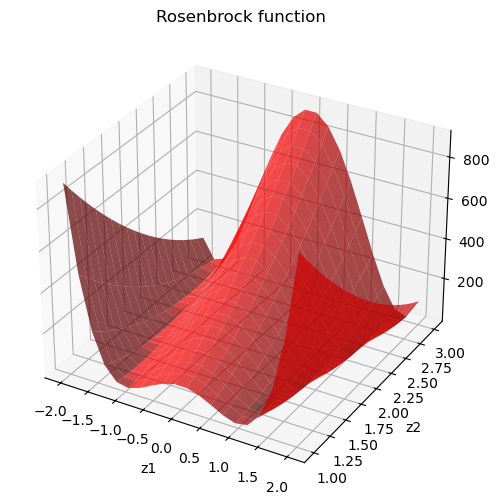

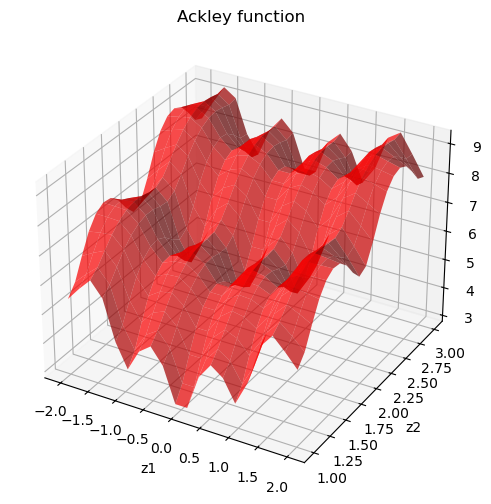

In [84]:
Nb_pt = 20
Z1,Z2 = np.meshgrid(np.linspace(-2,2,Nb_pt), np.linspace(1,3,Nb_pt))
Z11 = Z1.reshape((1,Nb_pt**2))
Z22 = Z2.reshape((1,Nb_pt**2))

y_ros = []
for i in range(Nb_pt**2):
    y_ros += [Rosenbrock([Z11[0,i], Z22[0,i]])]
y_ros = np.array(y_ros)
y_ros = y_ros.reshape(Nb_pt,Nb_pt)

y_ackley = []
for i in range(Nb_pt**2):
    y_ackley += [Ackley([Z11[0,i], Z22[0,i]])]
y_ackley = np.array(y_ackley)
y_ackley = y_ackley.reshape(Nb_pt,Nb_pt)


fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(projection='3d')
plt.title('Rosenbrock function')
surf = ax.plot_surface(Z1, Z2, y_ros, color='r', alpha=0.7)
ax.set_xlabel('z1')
ax.set_ylabel('z2')
ax.set_zlabel('y')

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(projection='3d')
plt.title('Ackley function')
surf = ax.plot_surface(Z1, Z2, y_ackley, color='r', alpha=0.7)
ax.set_xlabel('z1')
ax.set_ylabel('z2')
ax.set_zlabel('y')


display(HTML("""<style>#output-body {display: flex; align-items: center;justify-content: center;}</style>"""))  #to plot at the center of the page

In [85]:
#Optima of the function
Optimum_Rosenbrock = np.array([1., 1.])

Optimum_Ackley = np.array([0., 0.])

It does not work very well, the objective function is highly non convex, with many local minimas. In this situation, the algorithm's capacity to explore new regions is very influential on the quality of the solution found. Genetic algorithms generally balance between two dual properties; **exploration** and **exploitation**. Exploration is very important when non-local behaviour is present, and there is a strong necessity to look at every possible place if there is a good solution anywhere around. Exploitation, in an other hand, refers to the capacity to work at the fine-grained level and to converge efficiently towards an optimal solution when close by.

## 1- Design of a genetic algorithm

A genetic algorithm consists of an initialization step and 4 iterative steps:
 - Generation of the initial population
 
 - Step 1 : Evaluation of the population
 - Step 2 : Selection of the parents
 - Step 3 : Variation of the parents (crossover and mutation)
 - Step 4 : Selection of the new generation

### Binary coding of the population

In this part, a genetic algorithm with a binary coding of the population is considered. It means that the genes of an individual is coded according quite simply; a succession of $0$ and $1$.

One defines a function which transforms a binary number of `chunk_size` bits into a real number between `mini` and `maxi`. The first half of the gene (of size `chunk_size`) codes the first coordinate of the particle, and the second half codes the second coordinate. Therefore, the total length of the gene is `dimension`*`chunk_size`.

A number $(x)_2$ of $n$ bits is converted into a real according to the formula:
$$
X = \frac{(x)_{10}}{2^d - 1}(\text{max} - \text{min}) + \text{min}
$$

In [86]:
# Translation from binary coding to real coding
def _binary_to_real(binary,mini,maxi,dimension,chunk_size):
    """
    binary(array[bool])- Array to convert in a list of real.
    mini(array[float])- Minimum real authorized.
    maxi(array[float])- Maximum real authorized.
    dimension(int)- Dimension of the vector of float.
    chunk_size(int)- Size of the chunk converted to real of the vector binary.
    """
    real = []
    for d, lo, hi in zip(range(dimension), mini, maxi):
        b = binary[d*chunk_size:(d+1)*chunk_size] #Take a chunks of size dimensions_bits
        real_val = float(int(''.join([str(int(i)) for i in b]), 2)) #Convert number from 2 base to 10 base.
        value = real_val / (2**(chunk_size)-1) * (hi - lo) + lo
        real.append(value)
    return real

In [87]:
_binary_to_real(binary=[1,0,1,0,0,0,1,0,1,0,1,0],mini=[0,0],maxi=[1,1],dimension=2,chunk_size=6)

[0.6349206349206349, 0.6666666666666666]

The function `algo_genetique` follows the different steps of genetic algorithm: __initialization__, __evaluation__, __selection__, __cross-over__, __mutation__ and __replacement__.

In [88]:
#Definition of genetic algorithm
def algo_genetique_binary(f,num_generations,popsize,dim,mini,maxi,chunk_size,proba_crossover=0.9,proba_mutation=0.1):
    new_population = np.array([[np.random.choice([0, 1]) for _ in range(dim * chunk_size)] for _ in range(popsize)]) # random initialization
    for generation in range(num_generations):#iteration over the number of generations

        fitness = evaluate_population_binary(f, new_population, mini, maxi, chunk_size) #evaluation of the population

        parents = select_parents(new_population,fitness) #selection of the parents

        off_spring= crossover_binary(parents,proba_crossover) #cross-over of the parents

        off_spring = mutation(off_spring,proba_mutation) # mutation

        new_population = np.concatenate((new_population,off_spring), axis = 0)

        new_population = truncate_binary(f,new_population,mini,maxi,chunk_size) #selection of the new generation among the concatenation of both the new and ancient population

        if generation%50 == 0:
            print(f"We're at generation {generation}!")
    return new_population

With this settings, the degree of freedom are:
- The population size
- The number of generations
- The number of bits to code a gene (expressivity)
- The crossover rate
- The mutation rate

The mutation rate should improve the exploration capacity of the population. On an other hand, the crossover rate foster the exploitation capacity of the population.

- Evaluation of the population : Definition of the function that will be used to evaluate the objective function on the current population `evaluate_population`. 

`evaluate_population` takes as arguments the function that represents the fitness and the population to be evaluated. 

In [89]:
# Function used to evaluate the population
def evaluate_population_binary(f, pop, mini,maxi,chunk_size):
    fitness=np.zeros((len(pop),1))
    for i in range(len(pop)):
        real_value = _binary_to_real(pop[i],mini,maxi,dimension=2,chunk_size=chunk_size)
        fitness[i] =10000 - f(real_value)
    return fitness

- Selection of the parents: definition of the function `select_parents` used to select the parents. 

`select_parents` takes as arguments the current population, the fitness of each individual. It returns the parents for  mutation and cross-over. The selection method here is the roulette wheel.

In [90]:
# Selection function, takes as arguments the current population and the value of fitness
def select_parents(pop, fitness):
    sum_fitness = np.sum(fitness)
    proba = np.zeros((len(pop),1))
    for i in range(len(pop)):
        proba[i] = np.sum(fitness[:i+1])/sum_fitness  #empirical CDF of the fitness
    parents = pop
    for parent_num in range(len(pop)):
        r=np.random.rand() #generation of random number between 0 and 1
        if r<=proba[0]:
            parents[parent_num] = pop[0]
        else:
            for i in range(len(pop)-1):
                if proba[i]<=r<proba[i+1]:
                    parents[parent_num] = pop[i + 1]
    return parents

- Crossover of the parents:


Ones defines the crossover function for the binary coding. This function makes the cross-over between two parents by switching their genes from a random determined point.

In [91]:
#One point cross over function, takes as inputs the parents and a probability of cross-over

def crossover_binary(parents,proba_crossover):
    offspring = parents
    for k in range(0,len(parents),2):
        # Index of the first parent to mate.
        parent1_idx = k
        # Index of the second parent to mate.
        parent2_idx = (k+1)%parents.shape[0]
        # The new offspring will have the first half of its genes taken from the first parent.
        r = np.random.rand()
        #Crossover point chosen randomly
        crossover_point = np.random.choice(range(parents.shape[1]))
        if r<=proba_crossover:
             offspring[k, 0:crossover_point] = parents[parent1_idx, 0:crossover_point]
             offspring[k+1, 0:crossover_point] = parents[parent2_idx, 0:crossover_point]
             # The new offspring will have its second half of its genes taken from the second parent.
             offspring[k, crossover_point:] = parents[parent2_idx, crossover_point:]
             offspring[k+1, crossover_point:] = parents[parent1_idx, crossover_point:]
    return offspring

- Mutation:

Ones defines the mutation function for the binary coding. This function inverts a bit randomly. It helps a lot in the diversification competence of a GA.

In [92]:
#Mutation function, takes as inputs the offsprings and a probability of mutation
def mutation(off_spring,proba_mutation):
    s = off_spring.shape[1]
    for idx in range(off_spring.shape[0]):
        k = np.random.choice(range(s))
        r = np.random.rand()
        if r<=proba_mutation:
            off_spring[idx, k] = (off_spring[idx, k] + 1)%2
    return off_spring

- Selection of the new generation: definition of the truncature function  `truncate`. 

`truncate` takes as arguments the current population and the fitness function. The coded approach selects the individuals with the best fitness (elitist)

In [93]:
#Selection function
def truncate_binary(f , population,mini,maxi,chunk_size):
    pop_size=int(len(population)/2)
    population=np.array(population)
    fitness=evaluate_population_binary(f, population,mini,maxi,chunk_size)
    new_generation = np.empty((pop_size, population.shape[1]))
    for pop_num in range(pop_size):
        max_fitness_idx = np.where(fitness == np.max(fitness))
        max_fitness_idx = max_fitness_idx[0][0]
        new_generation[pop_num, :] = population[max_fitness_idx, :]
        fitness[max_fitness_idx] = -99999999999
    return new_generation

In [94]:
#Run of the genetic algorithm on the Rosenbrock function
mini = [-2,-1]
maxi = [2,3]
results=algo_genetique_binary(f=Rosenbrock,num_generations=100,popsize=200,dim=2,mini=mini,maxi=maxi,chunk_size=8,proba_mutation=1, proba_crossover=1)
fitness=evaluate_population_binary(f=Rosenbrock, pop=results,mini=mini,maxi=maxi,chunk_size=8)

#Conversion to real numbers
results_real = []
for i in results:
    results_real += [_binary_to_real(i,mini=mini,maxi=maxi,dimension=2,chunk_size=8)]

id_max, val = np.where(fitness == fitness.max())
id_max = id_max[0]
print('optimum value:',10000-fitness.max())
print('position', results_real[id_max])

We're at generation 0!
We're at generation 50!
optimum value: 0.5952497967173258
position [0.3215686274509806, 0.06666666666666665]


optimum in design space [0.3215686274509806, 0.06666666666666665]


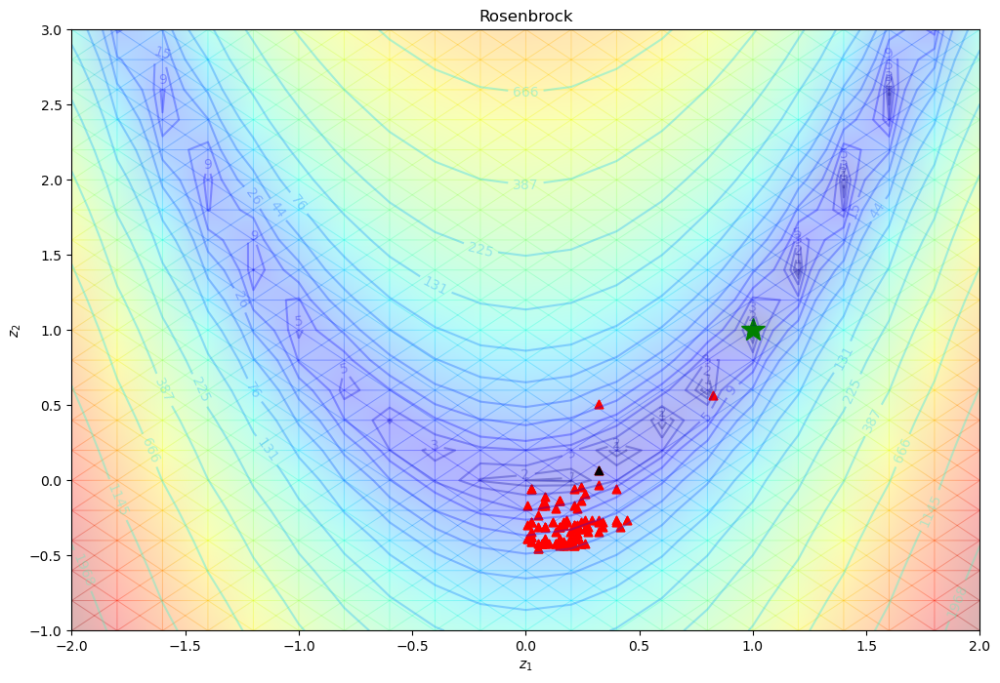

In [96]:
#Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))

##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([Rosenbrock(np.array([x,y])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock = z_rosenbrock.reshape(X.shape)
CS = plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Rosenbrock[0]],[Optimum_Rosenbrock[1]], 'g*', markersize=18) #Add the star
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_rosenbrock,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')

plt.scatter([candidate[0] for candidate in (results_real)],[candidate[1] for candidate in (results_real)],marker='^', c='red')

opt_cand = results_real[np.where(fitness == fitness.max())[0][0]]
print('optimum in design space', opt_cand)
plt.scatter(opt_cand[0], opt_cand[1], c='black', marker = '^')

plt.show()

In [21]:
#Run of the genetic algorithm on the Ackley function
mini = [-5,-5]
maxi = [5,5]
results = algo_genetique_binary(f=Ackley,num_generations=50,popsize=1000,dim=2,mini=mini,maxi=maxi,chunk_size=8,proba_mutation=.7, proba_crossover=.5)
fitness = evaluate_population_binary(f=Ackley, pop=results,mini=mini,maxi=maxi,chunk_size=8)

#Conversion to real numbers
results_real = []
for i in results:
    results_real += [_binary_to_real(i,mini=mini,maxi=maxi,dimension=2,chunk_size=8)]

id_max, val = np.where(fitness == fitness.max())
id_max = id_max[0]
print('optimum value:',10000-fitness.max())
print('position', results_real[id_max])

We're at generation 0!
optimum value: 0.8326667536239256
position [0.13725490196078383, 0.019607843137254832]


optimum in design space [0.13725490196078383, 0.019607843137254832]


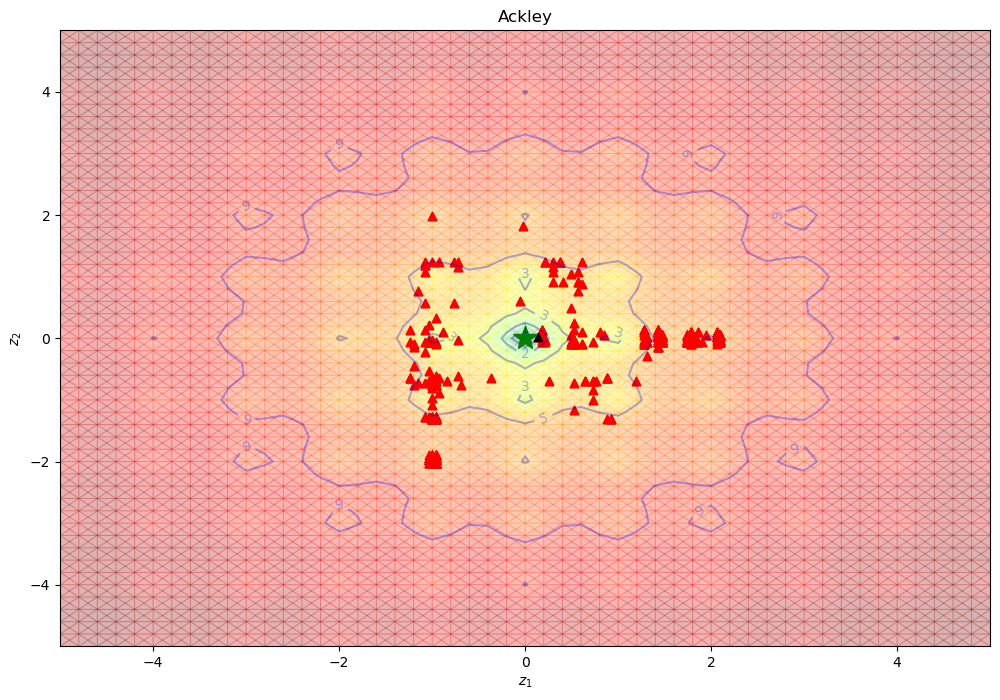

In [22]:
#Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
xmin, xmax, xstep = -5., 5., .2
ymin, ymax, ystep = -5., 5., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Ackley 2D ######
plt.figure(figsize=(12, 8))
z_ackley = np.array([Ackley(np.array([x,y])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_ackley  = z_ackley.reshape(X.shape)
CS = plt.contour(X, Y, Z_ackley, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Ackley[0]],[Optimum_Ackley[1]], 'g*', markersize=18) #Add the star
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_ackley,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Ackley')

plt.scatter([candidate[0] for candidate in (results_real)],[candidate[1] for candidate in (results_real)],marker='^', c='red')
opt_cand = results_real[np.where(fitness == fitness.max())[0][0]]
print('optimum in design space', opt_cand)
plt.scatter(opt_cand[0], opt_cand[1], c='black', marker = '^')

plt.show()

### Real coding
 
In the following, a real coding genetic algorithm is described. It basically means the population's gene is not coded with bits but real number.
See [**'Real-Coded Genetic Algorithms and Interval-Schemata'**](https://www.sciencedirect.com/science/article/abs/pii/B9780080948324500180) paper.

In [23]:
#Generic definition of genetic algorithm, takes as inputs the function to optimize, the number of generations
# the size of the population, the bounds on the opimization variables and the probabilities of cross over and mutation
def algo_genetique(f,num_generations, popsize, dim, mini,maxi, proba_crossover=0.9,proba_mutation=0.1):
    new_population = np.random.uniform(low=np.array([-2.0,-1.0]), high=np.array([2.,3.]), size=(popsize,dim)) #Starting population is placed randomly.
    
    for generation in range(num_generations): # loop over the number of generations

        fitness = evaluate_population(f, new_population) #evaluation of the population

        parents = select_parents(new_population,fitness) #selection of the parents
        
        off_spring_crossover = crossover(parents,proba_crossover, mini,maxi) #cross over of the parents
    
        off_spring = mutation(off_spring_crossover,proba_mutation) # mutation

        new_population = np.concatenate((new_population,off_spring)) #concatenation of the old generation and offsprings

        new_population = truncate(f,new_population) #selection of the new generation
        
    return new_population

- Evaluation of the population: Definition of the population evaluation function `evaluate_population`. 

`evaluate_population` takes as arguments the function to be optimized and the current population 


In [24]:
def evaluate_population(f, pop):
    fitness=np.zeros((len(pop),1))
    for i in range(len(pop)):
        fitness[i] =10000 - f(pop[i]) # transformation of the minimization problem into a maximization problem for the selection step
    return fitness

- Selection of the parents: definition of the function used to select the parents `select_parents`. 

`select_parents` takes as arguments the current population and the fitness of each individual. It returns the parents to be mutated and crossed-over. The selection method here is the roulette wheel.

In [25]:
# Selection function, takes as arguments the current population and the value of fitness
def select_parents(pop, fitness):
    sum_fitness = np.sum(fitness)
    proba = np.zeros((len(pop),1))
    for i in range(len(pop)):
        proba[i] = np.sum(fitness[:i+1])/sum_fitness #empirical CDF of the fitness
    parents = pop
    for parent_num in range(len(pop)):
        r=np.random.rand() #generation of random number between 0 and 1
        if r<=proba[0]:
            parents[parent_num] = pop[0]
        else:
            for i in range(len(pop)-1):
                if proba[i]<=r<proba[i+1]:
                    parents[parent_num] = pop[i + 1]
    return parents

- Crossover of the parents: Definition of the `crossover` function

`crossover` takes as inputs the list of parents, a probability of crossover and two positive floats `mini` and `maxi`. The coded approach is the simulated binary crossover, with interval constraints.

In [26]:
def crossover(parents,proba_crossover, mini,maxi):
    children = copy.copy(parents)
    for k in range(len(children)):
        if k%2==0:
            if np.random.random() < proba_crossover:
                dad_idx = np.random.choice(range(len(parents)))
                mom_idx = np.random.choice(range(len(parents)))
                while mom_idx == dad_idx: #can not cross over with yourself
                    mom_idx = np.random.choice(range(len(parents)))
                dad = parents[dad_idx]
                mom = parents[mom_idx]
                di = 10.
                bro = copy.copy(dad)
                sis = copy.copy(mom)
                for i, (m, d, lb, ub) in enumerate(zip(mom, dad, mini, maxi)): #lb for lowerbound, and ub for upperbound
                    try:
                        if m > d:
                            m, d = d, m
                        beta = 1.0 + 2 * min(m - lb, ub - d) / float(d - m)
                        alpha = 2.0 - 1.0 / beta**(di + 1.0)
                        u = np.random.random() #Random point of the CDF.
                        if u <= (1.0 / alpha):
                            beta_q = (u * alpha)**(1.0 / float(di + 1.0))
                        else:
                            beta_q = (1.0 / (2.0 - u * alpha))**(1.0 / float(di + 1.0))
                        bro_val = 0.5 * ((m + d) - beta_q * (d - m))
                        bro_val = max(min(bro_val, ub), lb)
                        sis_val = 0.5 * ((m + d) + beta_q * (d - m))
                        sis_val = max(min(sis_val, ub), lb)
                        if np.random.random() > 0.5:
                            bro_val, sis_val = sis_val, bro_val
                        if np.isnan(bro_val)==False:
                            bro[i] = bro_val
                        if np.isnan(sis_val)==False:
                            sis[i] = sis_val
                    except:
                        pass
                children[k]=bro
                children[k+1]=sis
    return children

- Mutation of offsprings: definition of the `mutation` function 

`mutation` takes as inputs the list of parents and a probability of mutation. The coded appraoch allows to add a uniform random number to a selected gene.

In [27]:
# Mutation function, takes as inputs the population and a probability of mutation
def mutation(off_spring, proba_mutation):
    for idx in range(off_spring.shape[0]):
        random_value=np.random.uniform(-1.0, 1.0, 1)
        k=np.random.choice(range(off_spring.shape[1]))
        r=np.random.rand()
        if r<=proba_mutation:
            off_spring[idx, k]=off_spring[idx, k] + random_value
    return off_spring

- Selection of the new generation: definition of the truncature function  `truncate`. 

`truncate` takes as arguments the current population and the fitness function. The coded approach selects the individuals with the best fitness (elitist)

In [28]:
def truncate(f , population):
    pop_size=int(len(population)/2)
    fitness=evaluate_population(f, population)
    new_generation=np.empty((pop_size, population.shape[1]))
    for pop_num in range(pop_size):
        max_fitness_idx=np.where(fitness == np.max(fitness))
        max_fitness_idx=max_fitness_idx[0][0]
        new_generation[pop_num, :]=population[max_fitness_idx, :]
        fitness[max_fitness_idx]=-99999999999
    return new_generation

In [29]:
# Run of genetic algorithm on the Rosenbrock function
final_pop=algo_genetique(f=Rosenbrock,num_generations=20, popsize=3000, dim=2, mini=[-2.0,-1.0], maxi=[2.,3.], proba_crossover=0.9, proba_mutation=0.25)
fitness=evaluate_population(Rosenbrock, final_pop)
print('optimal objective value:',10000-fitness.max())
opt_cand = final_pop[np.where(fitness == fitness.max())[0][0]]
print('optimum in design space', opt_cand)

C:\Users\hugon\AppData\Local\Temp\ipykernel_1300\3922846487.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  beta = 1.0 + 2 * min(m - lb, ub - d) / float(d - m)
C:\Users\hugon\AppData\Local\Temp\ipykernel_1300\839961875.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  off_spring[idx, k]=off_spring[idx, k] + random_value
C:\Users\hugon\AppData\Local\Temp\ipykernel_1300\3922846487.py:25: RuntimeWarning: invalid value encountered in scalar power
  beta_q = (1.0 / (2.0 - u * alpha))**(1.0 / float(di + 1.0))


optimal objective value: 0.0863255301665049
optimum in design space [1.03743119 1.04712168]


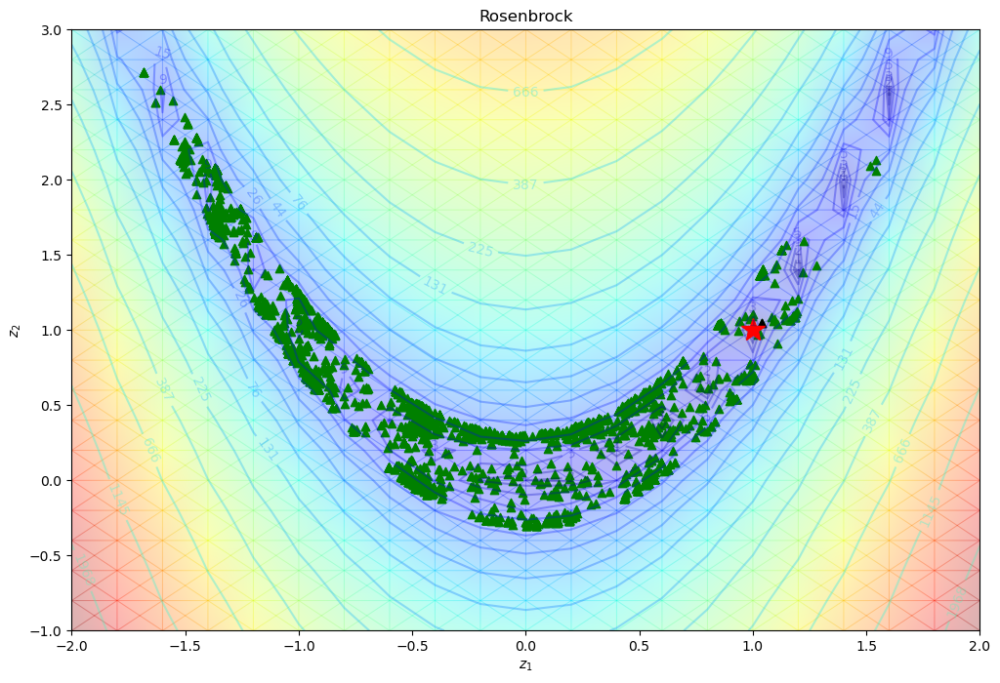

In [30]:
#Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([Rosenbrock(np.array([x,y])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock  = z_rosenbrock.reshape(X.shape)
CS=plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Rosenbrock[0]],[Optimum_Rosenbrock[1]], 'r*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_rosenbrock,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')

plt.scatter([candidate[0] for candidate in (final_pop)],[candidate[1] for candidate in (final_pop)],marker='^', c='g')
plt.scatter(opt_cand[0], opt_cand[1], c='black', marker = '^')
plt.show()

**It is clear that real genes coding is much more efficient than binary genes coding when it comes to both exploration and exploitation.**

# Exercices on Genetic Algorithm
On the Rosenbrock and Ackley functions :
- Test different crossover and mutation probabilities and answer the following questions: 

- What effect implies a crossover probability that is small with respect to the mutation probability?

- What is the effect of a mutation probability equal to 0?

- Test different approches for replacement and selection :

- What is the effect of elitist replacement and selection? 

In [31]:
# Run of genetic algorithm on the Ackley function
final_pop=algo_genetique(f=Ackley,num_generations=20,popsize=200,dim=2,mini=[-5.0,-5.0],maxi=[5.,5.],proba_crossover=0.9,proba_mutation=0.25)
fitness=evaluate_population(Ackley, final_pop)
print('optimal objective value:',10000-fitness.max())
opt_cand = final_pop[np.where(fitness == fitness.max())[0][0]]
print('optimum in design space', opt_cand)

C:\Users\hugon\AppData\Local\Temp\ipykernel_1300\839961875.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  off_spring[idx, k]=off_spring[idx, k] + random_value
C:\Users\hugon\AppData\Local\Temp\ipykernel_1300\3922846487.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  beta = 1.0 + 2 * min(m - lb, ub - d) / float(d - m)


optimal objective value: 1.5064976444537024
optimum in design space [ 0.09940128 -0.18924885]


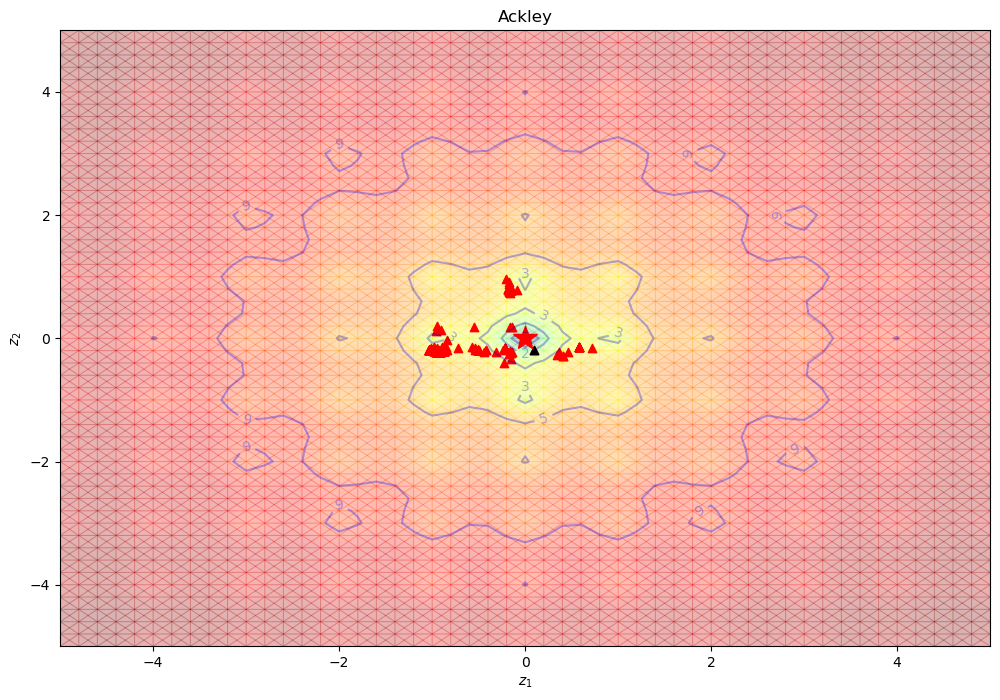

In [32]:
#Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
xmin, xmax, xstep = -5., 5., .2
ymin, ymax, ystep = -5., 5., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Ackley 2D ######
plt.figure(figsize=(12, 8))
z_Ackley = np.array([Ackley(np.array([x,y])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_Ackley  = z_Ackley.reshape(X.shape)
CS=plt.contour(X, Y, Z_Ackley, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Ackley[0]],[Optimum_Ackley[1]], 'r*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_Ackley,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Ackley')

plt.scatter([candidate[0] for candidate in (final_pop)],[candidate[1] for candidate in (final_pop)],marker='^', c='red')
plt.scatter(opt_cand[0], opt_cand[1], c='black', marker = '^')
plt.show()

## 2- Use of Inspyred package
Inspyred is a python library that allows the use of several population based algorithms such as GA, PSO, etc. It involves a particular structure of problem definition.

### Problem definition
An optimization problem is defined using a class. We have to specify the dimension of the variables, the bounds, a method for the generation of the initial propulation, a method for the evaluation operator and the nature of the optimization problem (minimization or maximization).

In [100]:
from inspyred.benchmarks import Benchmark
import inspyred
from inspyred import ec
from random import Random
from time import time
class Rosenbrock_pb(Benchmark):
    def __init__(self, dimensions=2): #  initialization, problem dimension
        Benchmark.__init__(self, dimensions)
        self.bounder = ec.Bounder([-2.0,-1.0], [2.0,3.0]) #bounds of the variables
        self.maximize = False # minimization
        self.global_optimum = [1 for _ in range(self.dimensions)]

    def generator(self, random,args): # generation of initial population
        return [random.uniform(-2.0, 2.0) , random.uniform(-1.0, 3.0)] #random generation

    def evaluator(self, candidates, args=0): # evaluation of points
        fitness = []
        for c in candidates:
            total = 0
            for i in range(len(c) - 1):
                total += 100 * (c[i]**2 - c[i+1])**2 + (c[i] - 1)**2 # Rosenbrock function
            fitness.append(total)
        return fitness

### Genetic algorithm with Inspyred
Inspyred provides a list of predefined functions for the selection, crossover, mutation and replacement. It is also possible to define the probabilities of mutation and cross over.
#### Selection operators: 

Parameter to select the parents of the next generation.

- `default_selection`: selection of the all the population
- `truncation_selection`: selection of the best individuals
- `uniform_selection`: random selection 
- `fitness_proportionate_selection`: selection based on a roulette wheel according to the fitness
- `rank_selection`: selection over the rank
- `tournament_selection`: selection by tournament

#### Crossover operators:
This choice is certainly the most influential on the performance of the algorithm.

The main categories of crossover operators are: 

(1) Asexual: an offspring is generated from one parent, 

(2) Sexual: two parents produce one or more offspring, and 

(3) Multi-recombination: more than two parents are used to produce one or more offspring.

- `n_point_crossover`: This function performs n-point crossover (NPX). It selects *n* random points without replacement at which to 'cut' the candidate solutions and recombine them. Produce two offsprings.


- `uniform_crossover`: This function performs uniform crossover (UX). For each element of the parents, a biased coin is flipped to determine whether the first offspring gets the 'mom' or the 'dad' element. Produce one offspring.


- `partially_matched/mapped_crossover`: This function performs partially matched crossover (PMX). This type of crossover assumes that the parents gene takes value in a discrete set, typically integers. Let $n$, the number of genes in a chromosome.

    Step 1: Two distinct points are randomly selected in $\llbracket 0, n - 1 \rrbracket$; they partition in three the chromosome. The genes between these two points are directly transferred to their respective childrens, i.e., parent I $\implies$ child I and parent II $\implies$ child II. 

    Step 2: for child I, look at the genes of parent II, and copy all the genes that are not already present in the middle section. Do the same for child II. There might remains some empty spots in the adjacent sections at this point. 

    Step 3: look at the middle section of parent II, and find an element that is not in child I. Note its index, and look at child I gene's value at the same location. Go back to parent II, and find the index of the gene that store this same value. If the corresponding index is empty, put the element in that spot. 

    Step 4: Repeat until all empty spots are filled.

- `arithmetic_crossover`: This function performs arithmetic crossover (AX). The arithmetic crossover operator works by generating a new offspring chromosome by taking a weighted average of the corresponding genes in the parent chromosomes; the weight is determined by a random number between 0 and 1, and the offspring chromosome is generated as follows: $c^1_i = \alpha  p^1_i + (1 - \alpha)  p^2_i$ where $c_i$ is the $i-th$ gene in the offspring chromosome, $p^1_i$ and $p^2_i$ are the corresponding genes in the parent chromosomes, and alpha is the weight factor. The value of alpha is usually chosen randomly from a uniform distribution between 0 and 1.

- `heuristic_crossover`: It performs heuristic crossover (HX), which is similar to the update rule used in particle swarm optimization.  two parents are selected from the population, and one offspring is produced. Then the genes of the child chromosome will be calculated as follows: $c^1_i = p^1_i + \alpha(p^2_i - p^1_i)$ where variable $\alpha$ is a random number between $0$ and $1$. Naturally, $c^2_i = \alpha  p^2_i + (1 - \alpha)  p^1_i$.
- `simulated_binary_crossover`: This function performs simulated binary crossover (SBX), following the implementation in NSGA-II, see $\textbf{'A Fast and Elitist Multiobjective Genetic Algorithm: NSGA-II'}$ or rather $\textbf{'Real-coded Genetic Algorithms with Simulated Binary Crossover: Studies on Multimodal and
Multiobjective Problems'}$ on P.4
- `laplace_crossover`:  This function performs Laplace crosssover (LX), following the implementation specified in (Deep and Thakur, "A new crossover operator for real coded genetic algorithms," Applied Mathematics and Computation, Volume 188, Issue 1, May 2007, pp. 895--911). Same as SBX, but with Laplace distribution, and not polynomial.

See https://medium.com/geekculture/crossover-operators-in-ga-cffa77cdd0c8 for more information.
#### Mutation operators
- `bit_flip_mutation`: This function performs bit-flip mutation. If a candidate solution contains non-binary values, this function leaves it unchanged.
- `gaussian_mutation`: This function performs Gaussian mutation. The Gaussian mutation operator $M_g$ changes the variable $x \in [a,b]$ to $\min(b,\max(a,N(x,\sigma)))$.
- `nonuniform_mutation`:  The function performs nonuniform mutation. This operator replaces the value of the chosen gene with a uniform random value selected between the user-specified upper and lower bounds for that gene. This mutation operator can only be used for integer and float genes.
#### Replacement operators:
- `truncation_replacement`: selection of the best individuals
- `generational_replacement`: replacement of the parent generation by the offsprings
- `random_replacement`: random replacement


It uses real coding, and not binary coding.

In [101]:
from inspyred.benchmarks import Benchmark
import inspyred
import numpy as np
from inspyred import ec
from random import Random
from time import time

class Rosenbrock_pb(Benchmark):
    def __init__(self, dimensions = 2): #  initialisation, dimension du problème
        Benchmark.__init__(self, dimensions)
        self.bounder = ec.Bounder([-2.0,-1.0], [2.0,3.0]) # bornes sur les variables
        self.maximize = False # minimisation
        self.global_optimum = [1 for _ in range(self.dimensions)]

    def generator(self, random, args): # génération de la population initiale
        return [random.uniform(-2.0, 2.0) , random.uniform(-1.0, 3.0)] #generation aleatoire sur les domaines de définitions des variables

    def evaluator(self, candidates, args=0): # evaluation des points 
        fitness = []
        for c in candidates:
            total = Rosenbrock(c) # fonction Rosenbrock
            fitness.append(total)
        return fitness

Definition of a class is not mandatory.

In [102]:
def generator(random, args): # génération de la population initiale
    return [random.uniform(-2.0, 2.0) , random.uniform(-1.0, 3.0)] #generation aleatoire sur les domaines de définitions des variables

def evaluator(candidates: np.ndarray, args=0): # evaluation des points 
    fitness = []
    for c in candidates: #c is the list of two numbers
        total = 100 * (c[0]**2 - c[1])**2 + (c[0] - 1)**2 # fonction Rosenbrock
        fitness.append(total)
    return fitness

In [103]:
# Definition du problème d'optimisation via GA en utilisant Inspyred
prng = Random()
prng.seed(time())
problem = Rosenbrock_pb(2)
ea = inspyred.ec.GA(prng)
ea.terminator = inspyred.ec.terminators.evaluation_termination
final_pop = ea.evolve(generator=problem.generator, #renseignement de la fonction de generation
                      evaluator=problem.evaluator,  #renseignement de la fonction d'évaluation
                      pop_size=1000,
                      maximize=False,  #renseignement du choix de maximisation ou minimisation
                      bounder=ec.Bounder([-2.0,-1.0], [2.0,3.0]),  #renseignement des bornes sur les variables d'optimisation
                      max_evaluations=1000,
                      crossover_rate=.9,
                      mutation_rate=0,
                      selector = inspyred.ec.selectors.tournament_selection, #choix de l'opérateur de sélection
                      variator=[inspyred.ec.variators.crossovers.simulated_binary_crossover,inspyred.ec.variators.mutators.gaussian_mutation], # choix des opérateurs de crossover et mutation
                      replacer=inspyred.ec.replacers.truncation_replacement)# choix de l'opérateur de remplacement

`final_pop` is the list containing the location, the birthdate and fitness, in ascending order, of all the particles.

In [104]:
stats = inspyred.ec.analysis.fitness_statistics(final_pop)
print('best',stats['best'])
print('worst',stats['worst'])
print('mean',stats['mean'])
print('median',stats['median'])
print('std',stats['std'])
print('location', final_pop[0].candidate)

best 0.0006881349288699283
worst 2199.5418479923715
mean 304.68168311576204
median 136.87112032279666
std 398.3906743912931
location [0.9933799812680699, 0.9842654604107453]


`ea.evolve`returns the final population. Each element contains the coordinates of the individuals and the corresponding fitness.

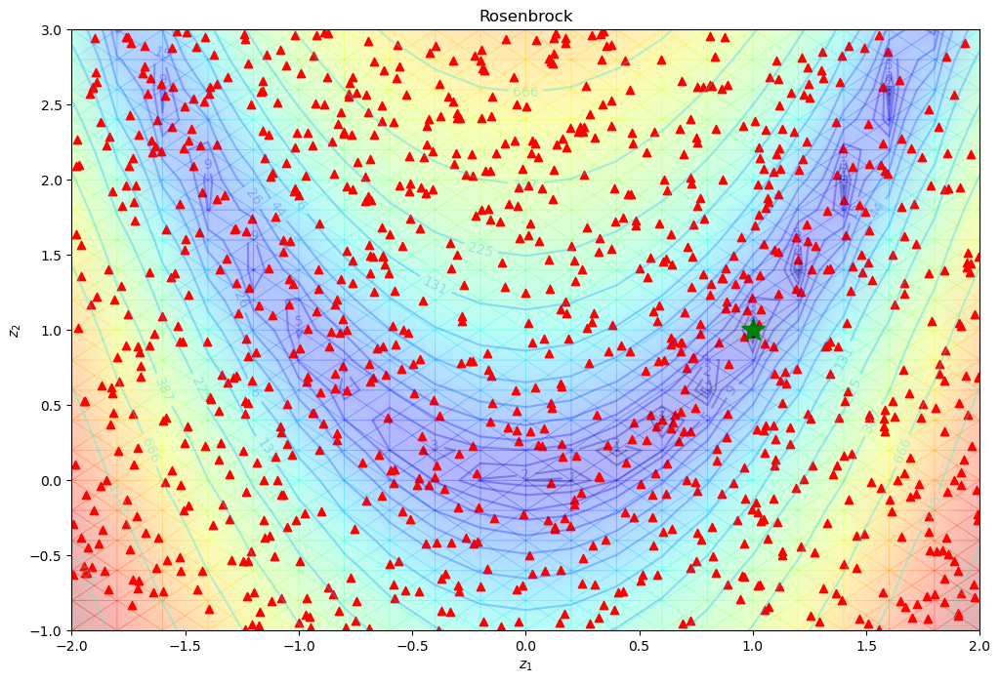

In [105]:
##Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
f=Rosenbrock_pb(2)
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([f.evaluator(np.array([[x,y]])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock  = z_rosenbrock.reshape(X.shape)
CS=plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Rosenbrock[0]],[Optimum_Rosenbrock[1]], 'g*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X, Y, Z_rosenbrock, shading='gouraud', norm=PowerNorm(gamma=0.3), cmap=plt.cm.jet, alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')

plt.scatter([candidate.candidate[0] for candidate in (final_pop)],[candidate.candidate[1] for candidate in (final_pop)],marker='^', c='red')
opt_cand = final_pop[0]
plt.scatter(opt_cand.candidate[0], opt_cand.candidate[1], c='black', marker = '^')
plt.show()

In [106]:
class Ackley_pb(Benchmark):
    def __init__(self, dimensions=2): #  initialization, problem dimension
        Benchmark.__init__(self, dimensions)
        self.bounder = ec.Bounder([-2.0,-2.0], [2.0,2.0]) # bounds of the variables
        self.maximize = False # minimisation
        self.global_optimum = [0 for _ in range(self.dimensions)]

    def generator(self, random,args): # generation of initial population
        return [random.uniform(-2.0, 2.0) , random.uniform(-2.0, 2.0)] #random generation

    def evaluator(self, candidates, args=0): # evaluation of points
        fitness = []
        for c in candidates:
            total = -20 * np.exp(-0.2*np.sqrt(0.5*(c[0]**2+c[1]**2))) - np.exp(0.5*np.cos(2*np.pi*c[0])+0.5*np.cos(2*np.pi*c[1])) + np.exp(1) + 20.
            fitness.append(total)
        return fitness

In [124]:
# Definition du problème d'optimisation via GA en utilisant Inspyred
prng = Random()
prng.seed(time()) 
problem = Ackley_pb(2)
ea = inspyred.ec.GA(prng)
ea.terminator = inspyred.ec.terminators.evaluation_termination
final_pop = ea.evolve(generator=problem.generator, #renseignement de la fonction de generation
                      evaluator=problem.evaluator,  #renseignement de la fonction d'évaluation
                      pop_size=1000,
                      maximize=problem.maximize,  #renseignement du choix de maximisation ou minimisation
                      bounder=problem.bounder,  #renseignement des bornes sur les variables d'optimisation
                      max_evaluations=2000,
                      crossover_rate=0.9,
                      mutation_rate=0.25,
                      selector = inspyred.ec.selectors.tournament_selection, #choix de l'opérateur de sélection
                      variator=[inspyred.ec.variators.crossovers.simulated_binary_crossover,inspyred.ec.variators.mutators.gaussian_mutation], # choix des opérateurs de crossover et mutation
                      replacer=inspyred.ec.replacers.truncation_replacement)# choix de l'opérateur de remplacement

In [125]:
stats = inspyred.ec.analysis.fitness_statistics(final_pop)
print('best',stats['best'])
print('worst',stats['worst'])
print('mean',stats['mean'])
print('median',stats['median'])
print('std',stats['std'])

best 0.36442295921408885
worst 7.7644925397183115
mean 4.562591059643134
median 4.4968364941652865
std 1.4237909416925905


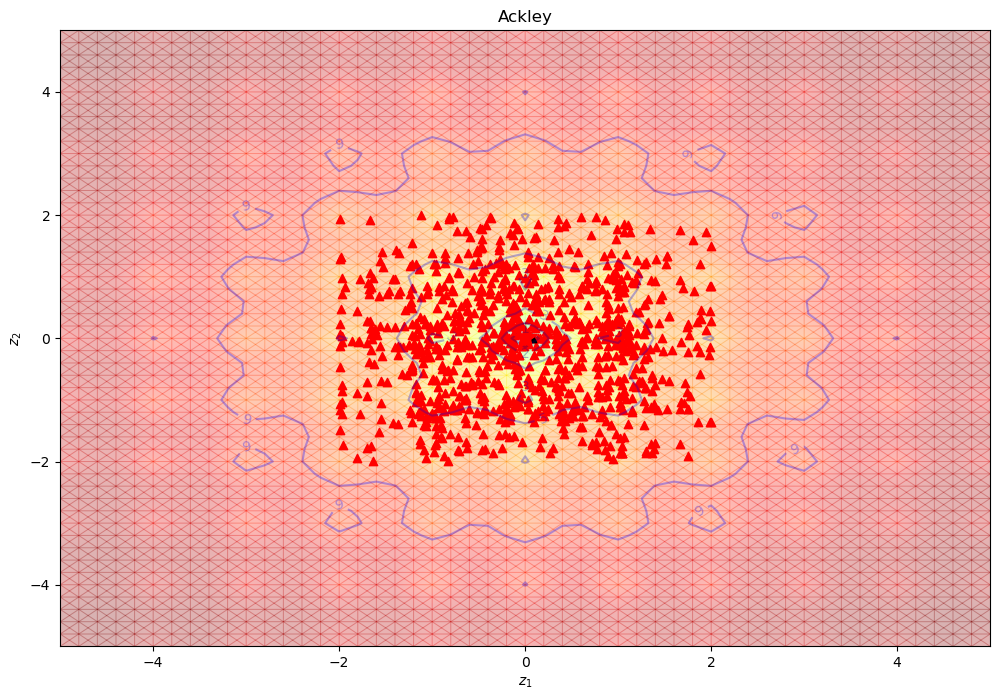

In [127]:
##Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
f=Ackley_pb(2)
xmin, xmax, xstep = -5., 5., .2
ymin, ymax, ystep = -5., 5., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_Ackley = np.array([f.evaluator([np.array([x,y])]) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_Ackley = z_Ackley.reshape(X.shape)
CS=plt.contour(X, Y, Z_Ackley, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Ackley[0]],[Optimum_Ackley[1]], 'r*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X, Y, Z_Ackley,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Ackley')

plt.scatter([candidate.candidate[0] for candidate in (final_pop)],[candidate.candidate[1] for candidate in (final_pop)],marker='^', c='red')
opt_cand = final_pop[0]
plt.scatter(opt_cand.candidate[0], opt_cand.candidate[1], c='black', marker = '^')
plt.show()

### 3- Implementation of Particle Swarm Optimization with Inspyred

Inspyred also provides PSO algorithms. 
- The following syntax allows to define the algorithm `ea = inspyred.swarm.PSO(prng)` 
- The following parameters allows to define the PSO topology: `ea.topology = inspyred.swarm.topologies.ring_topology`. Two choices are possible: 
    - `ring_topology`: in the ring topology, each agent has two neighbors, such that the overall network has the form of a ring.
    - `star_topology`: .
- The following lines allows to perform the evolution of the particle swarm:

    `final_pop= ea.evolve(generator=problem.generator,
                      evaluator=problem.evaluator, 
                      pop_size=30,
                      bounder=problem.bounder,
                      maximize=problem.maximize,
                      max_evaluations=400,
                      social_rate=0.4,
                      cognitive_rate= 0.4,
                      inertia_rate=0.4)`


In [110]:
def generator(random, args): # génération de la population initiale
    return [random.uniform(-2.0, 2.0) , random.uniform(-1.0, 3.0)] #generation aleatoire sur les domaines de définitions des variables

def evaluator(candidates: np.ndarray, args=0): # evaluation des points 
    fitness = []
    for c in candidates: #c is the list of two numbers
        total = 100 * (c[0]**2 - c[1])**2 + (c[0] - 1)**2 # fonction Rosenbrock
        fitness.append(total)
    return fitness

In [111]:
ea = inspyred.swarm.PSO(prng) #Define the algorithm
ea.terminator = inspyred.ec.terminators.evaluation_termination #Define a maximum of function evaluation.
ea.topology = inspyred.swarm.topologies.ring_topology #Définis le voisinage d'une particule.
final_pop = ea.evolve(generator=generator,
                      evaluator=evaluator, 
                      pop_size=1000,
                      bounder=problem.bounder,
                      maximize=problem.maximize,
                      max_evaluations=400,
                      social_rate=0.1, #choix de la valeur du paramètre social
                    cognitive_rate= 0.25, #choix de la valeur du paramètre cognitif
                    inertia_rate=0.25)#choix de la valeur du paramètre d'inertie

In [112]:
stats = inspyred.ec.analysis.fitness_statistics(final_pop)
print('best',stats['best'])
print('worst',stats['worst'])
print('mean',stats['mean'])
print('median',stats['median'])
print('std',stats['std'])

best 0.04123738693339736
worst 2298.4929743244456
mean 289.46978531830285
median 133.42678998838178
std 378.749631058659


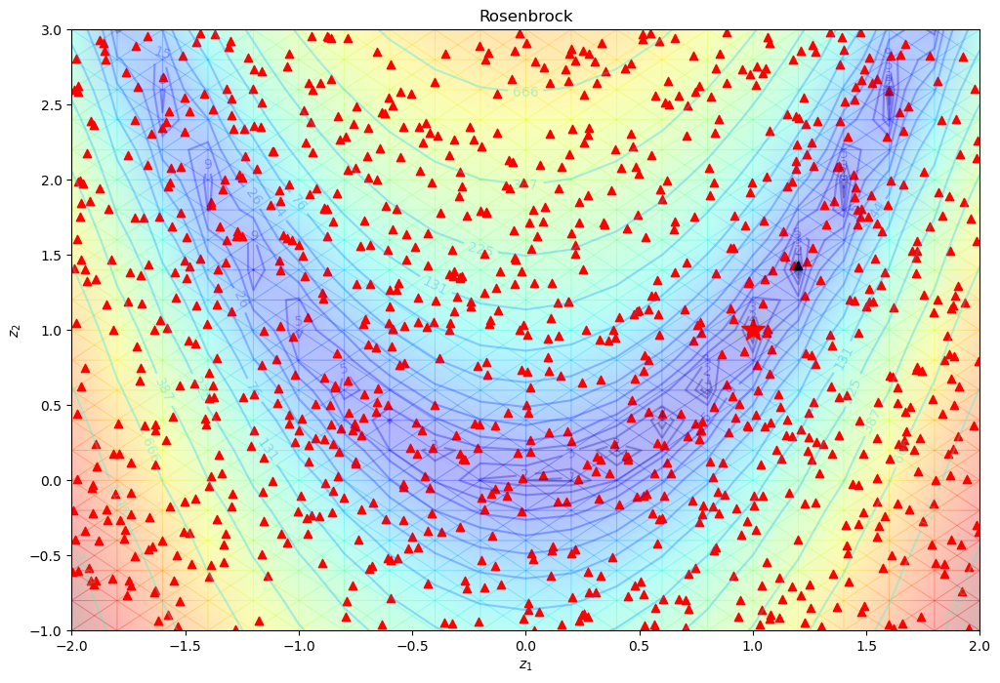

In [113]:
#Visualization on the Rosenbrock function

f=Rosenbrock_pb(2)
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([f.evaluator(np.array([[x,y]])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock  = z_rosenbrock.reshape(X.shape)
CS=plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Rosenbrock[0]],[Optimum_Rosenbrock[1]], 'r*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_rosenbrock,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')
plt.scatter([candidate.candidate[0] for candidate in (final_pop)],[candidate.candidate[1] for candidate in (final_pop)],marker='^', c='red')

opt_cand = final_pop[0]
plt.scatter(opt_cand.candidate[0], opt_cand.candidate[1], c='black', marker = '^')
plt.show()

# Exercice :
- On  Rosenbrock and Ackley :
    - Test different values for `social_rate`, `cognitive_rate` and `inertia_rate`, and conclude on the impact of the parameters on the trade off exploration / exploitation.

In [152]:
problem = Ackley_pb(2)
ea = inspyred.swarm.PSO(prng)
ea.terminator = inspyred.ec.terminators.evaluation_termination
ea.topology = inspyred.swarm.topologies.ring_topology
final_pop= ea.evolve(generator=problem.generator,
                      evaluator=problem.evaluator, 
                      pop_size=100,
                      bounder=problem.bounder,
                      maximize=problem.maximize,
                      max_evaluations=2000,
                      social_rate=0.1, #choix de la valeur du paramètre social
                    cognitive_rate= 0.25, #choix de la valeur du paramètre cognitif
                    inertia_rate=0.25)#choix de la valeur du paramètre d'inertie
opt_cand = final_pop[np.argmin(list(map(lambda x: x.fitness, final_pop)))].candidate

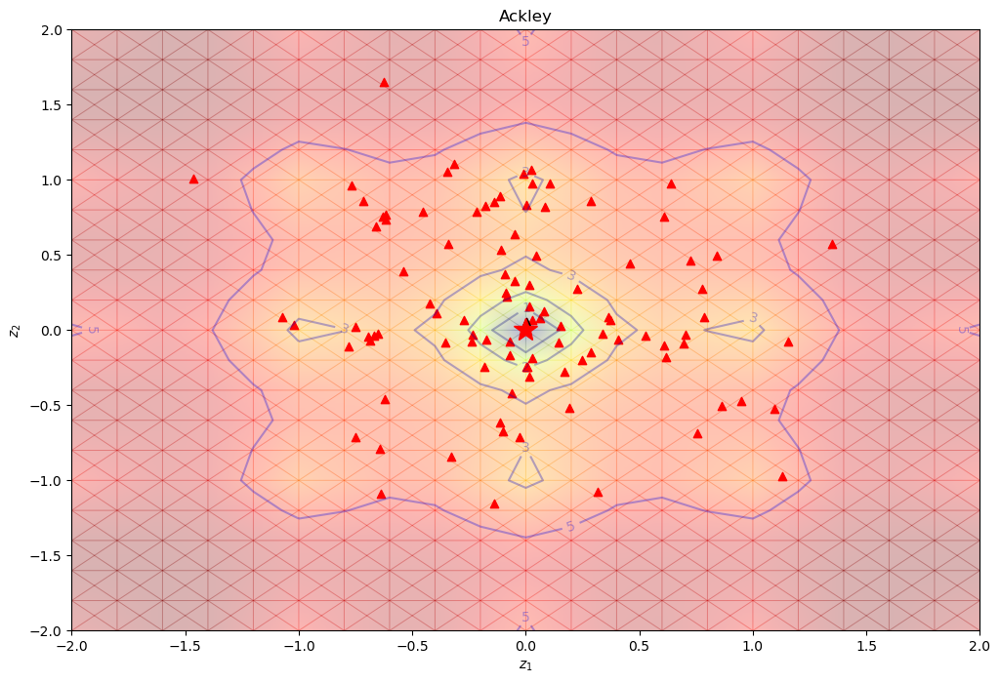

In [153]:
##Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
f=Ackley_pb(2)
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -2., 2., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_Ackley = np.array([f.evaluator([np.array([x,y])]) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_Ackley  = z_Ackley.reshape(X.shape)
CS=plt.contour(X, Y, Z_Ackley, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Ackley[0]],[Optimum_Ackley[1]], 'r*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_Ackley,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Ackley')

plt.scatter([candidate.candidate[0] for candidate in (final_pop)],[candidate.candidate[1] for candidate in (final_pop)],marker='^', c='red')
plt.scatter(opt_cand[0], opt_cand[1], c='black', marker = '^')
plt.show()

In [154]:
stats = inspyred.ec.analysis.fitness_statistics(final_pop)
print('best',stats['best'])
print('worst',stats['worst'])
print('mean',stats['mean'])
print('median',stats['median'])
print('std',stats['std'])

best 0.2367227400244971
worst 6.6134176823022734
mean 3.181181899003874
median 3.1898621084584846
std 1.2632181495291774


## 3- Handling of constraints

The approaches considered before are unconstrained. In this section, constraints are considered to illustrate several methods to handle them.

We consider a constraint $g(\textbf{z})$ as feasible in  $\textbf{z}$ iif  $g(\textbf{z})\leq 0$

For the sake of conciseness, I will only deal with Rosenbrock function from now on.

One defines two constraints: 
- $g1(\textbf{z})=z_0-z_1+1 \leq 0$
- $g2(\textbf{z})=z_0^6-z_1+0.5  \leq 0 $

In [157]:
def g1(z: np.ndarray):
    """
    First constraint
    """
    z = np.array(z)
    return z[...,0] - z[...,1] + 1
def g2(z: np.ndarray):
    """
    2nd constraint
    """
    z = np.array(z)
    return z[...,0]**6 - z[...,1] + 0.5

### 1 - Penalization methods
The penalization takes into account the constraints by modifying the objective function as follows:
$\tilde{f}(\textbf{z}) = f(\textbf{z}) + rp(\textbf{z})$

$p(\textbf{z})$ is a function of the constraint violation $res(\textbf{z})$ and $r$ the penalization parameter.
Most of the time, $res(\textbf{z}) = ||z||^2$ for an equality constraint, and $res(\textbf{z}) = ||(z)_+||^2$ for an inequality constraint.

In [158]:
from collections.abc import Callable

# definition of the violation function of the constraints
def res(constraints: list[Callable]):
    def R(x):
        sigma = 0
        for constraint in constraints:
            sigma += np.max((0,constraint(x)))
        return sigma
    return R

In [159]:
#Death penalty

def death_penalty(f: Callable, res, constraints: list[Callable]):
    residual = res(constraints)
    def d(x):
        # print(x, residual(x))
        if residual(x) <= 0:
            return f(x)
        else:
            return 10000
    return d

In [160]:
#Static penalty
def static_penalty(f: Callable, res: Callable, constraints: list[Callable], K: int = 1000):
    residual = res(constraints)
    def d(x):
        r = residual(x)
        if r==0:
            return f(x)
        else:
            return f(x) + K * r

### Binary coding

In [ ]:
#Run of the genetic algorithm on the Rosenbrock function
mini = [-2,-1]
maxi = [2,3]
Ros_pen = death_penalty(Rosenbrock, res, [g1, g2])
results=algo_genetique_binary(f=Ros_pen,num_generations=100,popsize=150,dim=2,mini=mini,maxi=maxi,chunk_size=8,proba_mutation=1, proba_crossover=1)
fitness=evaluate_population_binary(f=Ros_pen, pop=results,mini=mini,maxi=maxi,chunk_size=8)

#Conversion to real numbers
results_real = []
for i in results:
    results_real += [_binary_to_real(i,mini=mini,maxi=maxi,dimension=2,chunk_size=8)]

id_max, val = np.where(fitness == fitness.max())
id_max = id_max[0]
print('optimum value:',10000-fitness.max())
print('position', results_real[id_max])

We're at generation 0!
We're at generation 50!
optimum value: 114.86463698565603
position [0.05490196078431353, 1.0705882352941178]


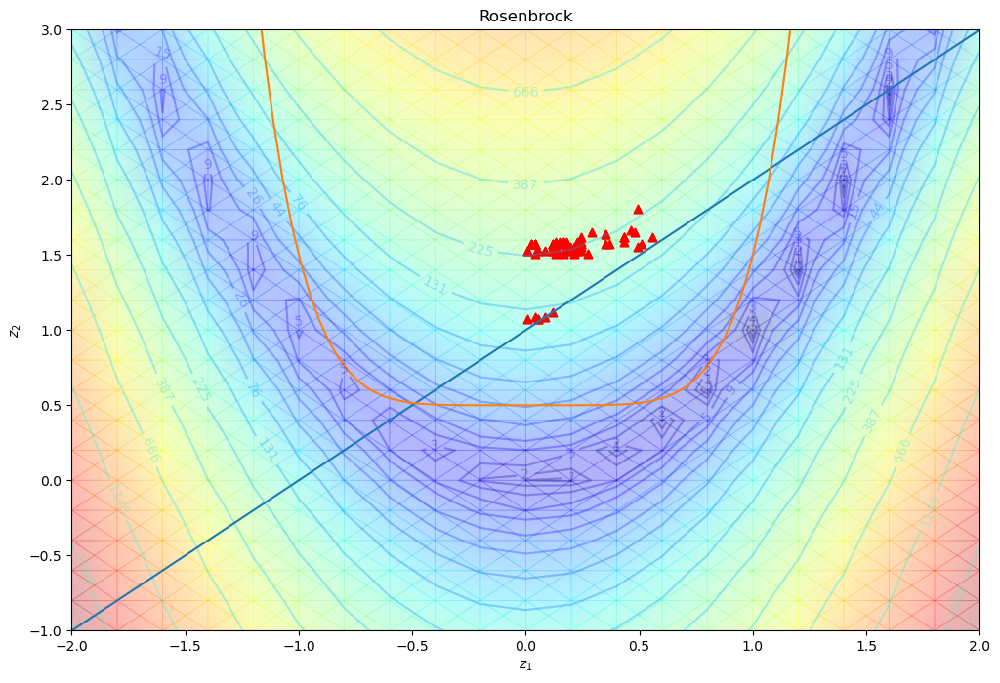

In [ ]:
#Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))

##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([Rosenbrock(np.array([x,y])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock = z_rosenbrock.reshape(X.shape)
CS = plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_rosenbrock,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.scatter([candidate[0] for candidate in (results_real)],[candidate[1] for candidate in (results_real)],marker='^', c='red')

opt_cand = final_pop[np.where(fitness == fitness.max())[0][0]]
plt.scatter(opt_cand[0], opt_cand[1], c='black', marker = '^')

t=np.linspace(-2,2,100)
G1=[t[i] + 1 for i in range(len(t))]
G2=[t[i]**6+0.5 for i in range(len(t))]
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.plot(t,G1)
plt.plot(t,G2)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')
plt.show()

### Real coding

In [203]:
#Run of the genetic algorithm on the Rosenbrock function
mini = [-2,-1]
maxi = [2,3]
Ros_pen = death_penalty(Rosenbrock, res, [g1, g2])
results=algo_genetique(f=Ros_pen,num_generations=20,popsize=1500,dim=2,mini=mini,maxi=maxi,proba_mutation=1, proba_crossover=1)
fitness=evaluate_population(f=Ros_pen, pop=results_real)

id_max, val = np.where(fitness == fitness.max())
id_max = id_max[0]
print('optimum value:',10000-fitness.max())
print('position', results_real[id_max])

C:\Users\hugon\AppData\Local\Temp\ipykernel_8932\3922846487.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  beta = 1.0 + 2 * min(m - lb, ub - d) / float(d - m)
C:\Users\hugon\AppData\Local\Temp\ipykernel_8932\839961875.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  off_spring[idx, k]=off_spring[idx, k] + random_value


optimum value: 114.86463698565603
position [0.05490196078431353, 1.0705882352941178]


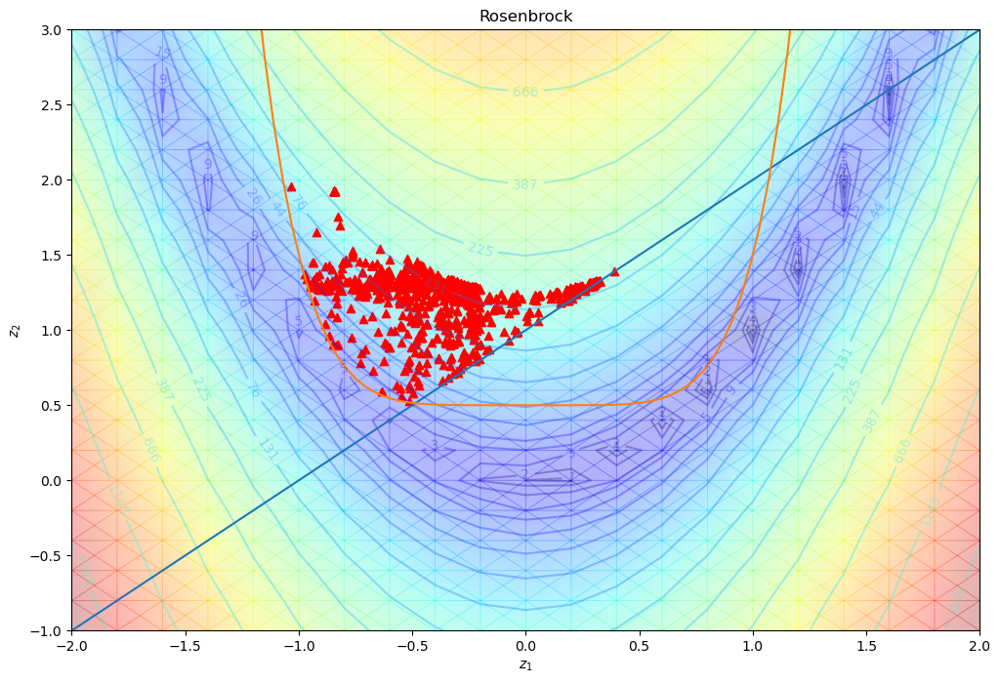

In [ ]:
#Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))

##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([Rosenbrock(np.array([x,y])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock = z_rosenbrock.reshape(X.shape)
CS = plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_rosenbrock,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.scatter([candidate[0] for candidate in (results)],[candidate[1] for candidate in (results)],marker='^', c='red')

opt_cand = final_pop[np.where(fitness == fitness.max())[0][0]]
plt.scatter(opt_cand[0], opt_cand[1], c='black', marker = '^')

t=np.linspace(-2,2,100)
G1=[t[i]+1 for i in range(len(t))]
G2=[t[i]**6+0.5 for i in range(len(t))]
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.plot(t,G1)
plt.plot(t,G2)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')
plt.show()

### With Inspyred

Genetic Algorithm

In [161]:
def generator(random, args): # génération de la population initiale
    return [random.uniform(-2.0, 2.0) , random.uniform(-1.0, 3.0)] #generation aleatoire sur les domaines de définitions des variables

def Ros_pen(f, constraints):
    residual = res(constraints)
    def evaluator_penalty(candidates: np.ndarray, args): # evaluation des points 
        fitness = []
        for c in candidates: #c is the list of two numbers
            if residual(c) <= 0:
                total = f(c) # fonction Rosenbrock
                fitness.append(total)
            else:
                fitness.append(10000)
        return fitness
    return evaluator_penalty

In [163]:
# Definition du problème d'optimisation via GA en utilisant Inspyred
prng = Random()
prng.seed(time())
ea = inspyred.ec.GA(prng)
evaluator_p = Ros_pen(Rosenbrock, [g1, g2])
ea.terminator = inspyred.ec.terminators.evaluation_termination
final_pop = ea.evolve(generator=generator, #renseignement de la fonction de generation
                      evaluator=evaluator_p,  #renseignement de la fonction d'évaluation
                      pop_size=500,
                      maximize=False,  #renseignement du choix de maximisation ou minimisation
                      bounder=ec.Bounder([-2.0,-1.0], [2.0,3.0]),  #renseignement des bornes sur les variables d'optimisation
                      max_evaluations=1000,
                      crossover_rate=1,
                      mutation_rate=0.7,
                      selector = inspyred.ec.selectors.tournament_selection, #choix de l'opérateur de sélection
                      variator=[inspyred.ec.variators.crossovers.simulated_binary_crossover,inspyred.ec.variators.mutators.gaussian_mutation], # choix des opérateurs de crossover et mutation
                      replacer=inspyred.ec.replacers.truncation_replacement)# choix de l'opérateur de remplacement

In [164]:
stats = inspyred.ec.analysis.fitness_statistics(final_pop)
print('best',stats['best'])
print('worst',stats['worst'])
print('mean',stats['mean'])
print('median',stats['median'])
print('std',stats['std'])
print('location', final_pop[0].candidate)

best 7.2007604719741805
worst 10000
mean 6509.992926361275
median 10000.0
std 4634.958996822234
location [-0.7951760321295427, 0.8317567580047136]


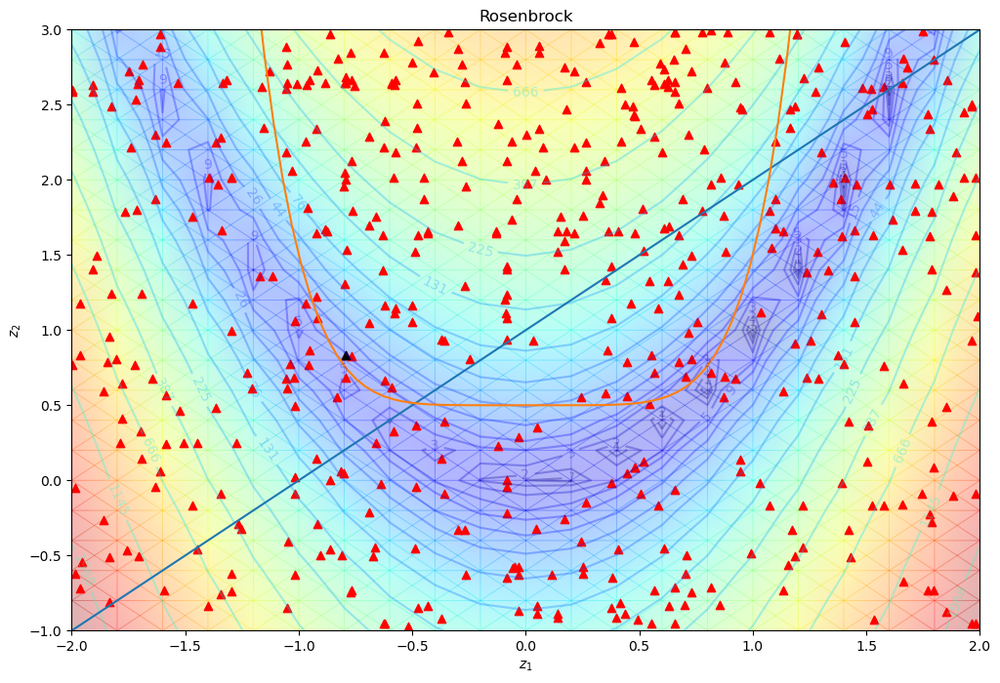

In [165]:
##Representation of the individuals
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm,PowerNorm
import matplotlib.colors as colors
f=Rosenbrock_pb(2)
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([f.evaluator(np.array([[x,y]])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock  = z_rosenbrock.reshape(X.shape)
CS=plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X, Y, Z_rosenbrock, shading='gouraud', norm=PowerNorm(gamma=0.3), cmap=plt.cm.jet, alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')

plt.scatter([candidate.candidate[0] for candidate in (final_pop)],[candidate.candidate[1] for candidate in (final_pop)],marker='^', c='red')
opt_cand = final_pop[0]
plt.scatter(opt_cand.candidate[0], opt_cand.candidate[1], c='black', marker = '^')
t=np.linspace(-2,2,100)
G1=[t[i]+1 for i in range(len(t))]
G2=[t[i]**6+0.5 for i in range(len(t))]
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.plot(t,G1)
plt.plot(t,G2)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')
plt.show()

Particle Swarm optimization

In [166]:
def generator(random, args): # génération de la population initiale
    return [random.uniform(-2.0, 2.0) , random.uniform(-1.0, 3.0)] #generation aleatoire sur les domaines de définitions des variables

def Ros_pen(f, constraints):
    residual = res(constraints)
    def evaluator_penalty(candidates: np.ndarray, args): # evaluation des points 
        fitness = []
        for c in candidates: #c is the list of two numbers
            if residual(c) <= 0:
                total = f(c) # fonction Rosenbrock
                fitness.append(total)
            else:
                fitness.append(10000)
        return fitness
    return evaluator_penalty

In [167]:
ea = inspyred.swarm.PSO(prng) #Define the algorithm
ea.terminator = inspyred.ec.terminators.evaluation_termination #Define a maximum of function evaluation.
ea.topology = inspyred.swarm.topologies.ring_topology #Définis le voisinage d'une particule.
evaluator_p = Ros_pen(Rosenbrock, [g1, g2])
final_pop = ea.evolve(generator=generator,
                      evaluator=evaluator_p,
                      pop_size=1000,
                      bounder=problem.bounder,
                      maximize=problem.maximize,
                      max_evaluations=400,
                      social_rate=0.1, #choix de la valeur du paramètre social
                    cognitive_rate= 0.25, #choix de la valeur du paramètre cognitif
                    inertia_rate=0.25)#choix de la valeur du paramètre d'inertie

In [168]:
stats = inspyred.ec.analysis.fitness_statistics(final_pop)
print('best',stats['best'])
print('worst',stats['worst'])
print('mean',stats['mean'])
print('median',stats['median'])
print('std',stats['std'])

best 8.182112239086319
worst 10000
mean 7601.144034794194
median 10000.0
std 4178.7170881945185


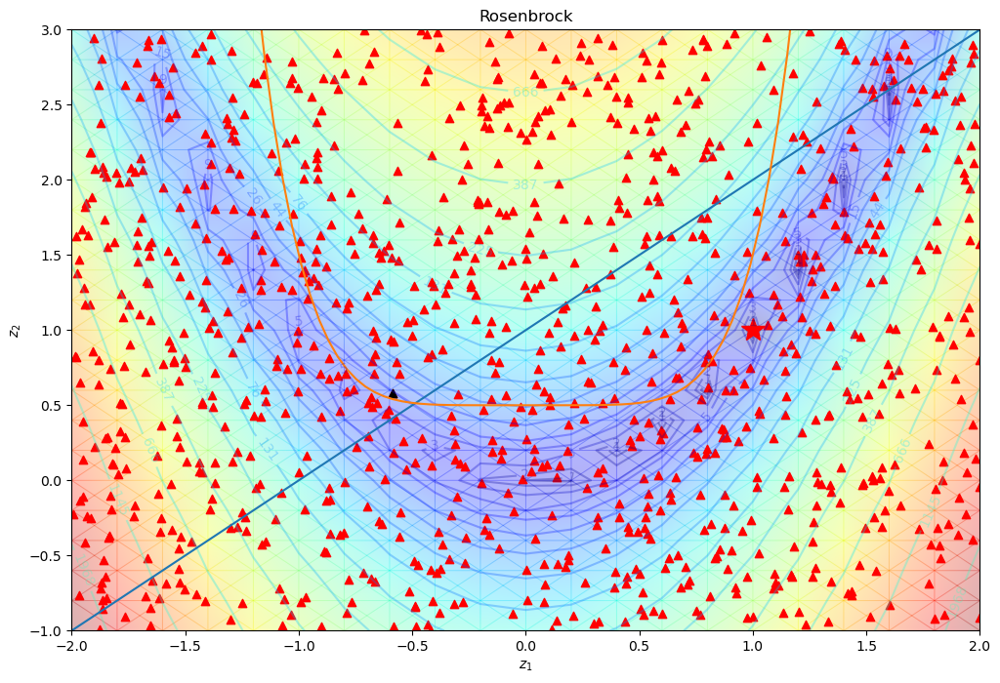

In [ ]:
#Visualization on the Rosenbrock function

f=Rosenbrock_pb(2)
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([f.evaluator(np.array([[x,y]])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock  = z_rosenbrock.reshape(X.shape)
CS=plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Rosenbrock[0]],[Optimum_Rosenbrock[1]], 'r*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_rosenbrock,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')
plt.scatter([candidate.candidate[0] for candidate in (final_pop)],[candidate.candidate[1] for candidate in (final_pop)],marker='^', c='red')
opt_cand = final_pop[0]
plt.scatter(opt_cand.candidate[0], opt_cand.candidate[1], c='black', marker = '^')
t=np.linspace(-2,2,100)
G1=[t[i]+1 for i in range(len(t))]
G2=[t[i]**6+0.5 for i in range(len(t))]
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.plot(t,G1)
plt.plot(t,G2)
plt.xlabel('$z_1$')
plt.ylabel('$z_2$')
plt.title('Rosenbrock')
plt.show()

### Handling of the constraints by 'constraint dominance' technique
- A feasible candidate is always prefered to an unfeasible one,
- Between two feasible candidates, the candidate with the best fitness is prefered,
- Between two unfeasible candidates, the candidate that violates the less the constraints is prefered.

In [48]:
#Definition of constraint dominance function
def contrainte_dominance(x, f, res, *constraints):
    """
    Compute a constraint dominance technique.
    """
    r = res(x,*constraints)
    if r==0:
        return f(x)
    else:
        return 9000 + r

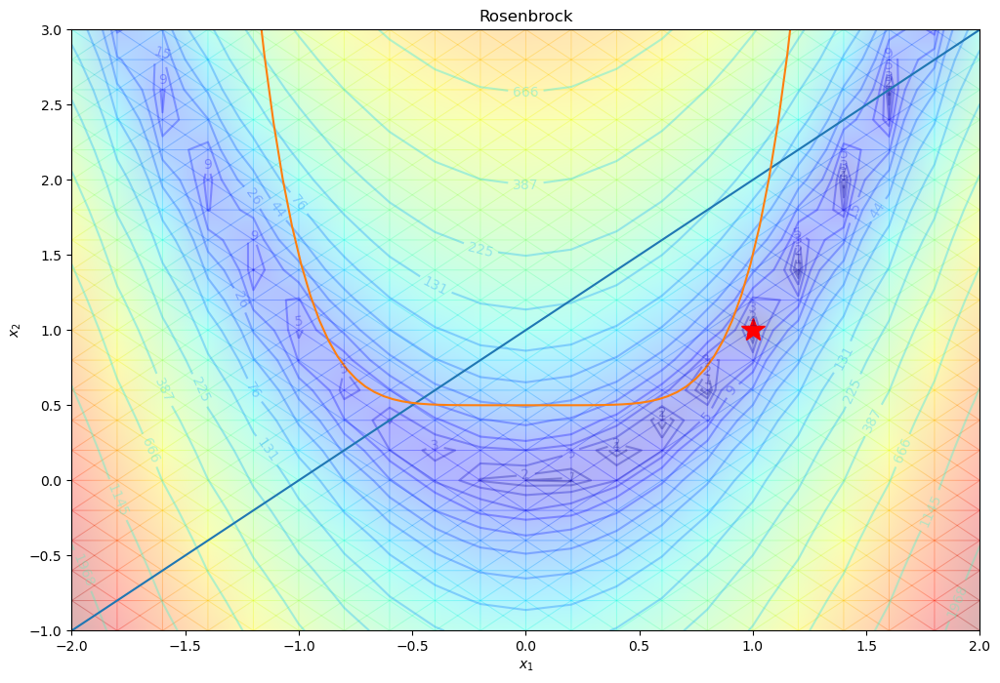

In [49]:
#Illustrations on the Rosenbrock function
def Rosenbrock(x):
    return 100 * (x[1]-x[0]**2)**2+(1-x[0])**2

f=Rosenbrock
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([f(np.array([x,y])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock  = z_rosenbrock.reshape(X.shape)
CS = plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Rosenbrock[0]],[Optimum_Rosenbrock[1]], 'r*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_rosenbrock,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
t=np.linspace(-2,2,100)
G1=[t[i]+1 for i in range(len(t))]
G2=[t[i]**6+0.5 for i in range(len(t))]
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.plot(t,G1)
plt.plot(t,G2)
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.title('Rosenbrock')
plt.show()

In [50]:
# Definition of genetic algorithm with constraint handling
def algo_genetique(f,constraint_handling,res,num_generations,popsize,dim, mini,maxi , proba_crossover,proba_mutation,*constraints):
    new_population = np.random.uniform(low=np.array([-2.0,-1.0]), high=np.array([2.0,3.0]), size=(popsize,dim))
    for generation in range(num_generations):

        fitness = evaluate_population(f,new_population,constraint_handling,res ,*constraints)

        parents = select_parents(new_population,fitness)

        off_spring_crossover = crossover(parents,proba_crossover, mini,maxi)

        off_spring = mutation(off_spring_crossover,proba_mutation)

        new_population = np.concatenate((new_population,off_spring))

        new_population = truncate(f,new_population,constraint_handling,res,*constraints)

    return new_population

def evaluate_population(f, pop,constraint_handling,res,*constraints):
    fitness=np.zeros((len(pop),1))
    for i in range(len(pop)):
        fitness[i] =10000 - constraint_handling(pop[i],f, res, *constraints)
    return fitness

def truncate(f , population,constraint_handling,res,*constraints):
    pop_size=int(len(population)/2)
    fitness=evaluate_population(f, population,constraint_handling,res,*constraints)
    new_generation = np.empty((pop_size, population.shape[1]))
    for pop_num in range(pop_size):
        max_fitness_idx = np.where(fitness == np.max(fitness))
        max_fitness_idx = max_fitness_idx[0][0]
        new_generation[pop_num, :] = population[max_fitness_idx, :]
        fitness[max_fitness_idx] = -99999999999
    return new_generation

In [51]:
final_pop=algo_genetique(Rosenbrock,contrainte_dominance,res,50,200,2,[-2.,-1.],[2.,3.],0.9,0.25,g1,g2)
fitness=evaluate_population(Rosenbrock, final_pop,death_penalty,res)
10000-fitness.max()

C:\Users\hugon\AppData\Local\Temp\ipykernel_22052\3922846487.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  beta = 1.0 + 2 * min(m - lb, ub - d) / float(d - m)
C:\Users\hugon\AppData\Local\Temp\ipykernel_22052\2924525579.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  off_spring[idx, k] = off_spring[idx, k] + random_value
C:\Users\hugon\AppData\Local\Temp\ipykernel_22052\3922846487.py:25: RuntimeWarning: invalid value encountered in scalar power
  beta_q = (1.0 / (2.0 - u * alpha))**(1.0 / float(di + 1.0))


2.871785096664098

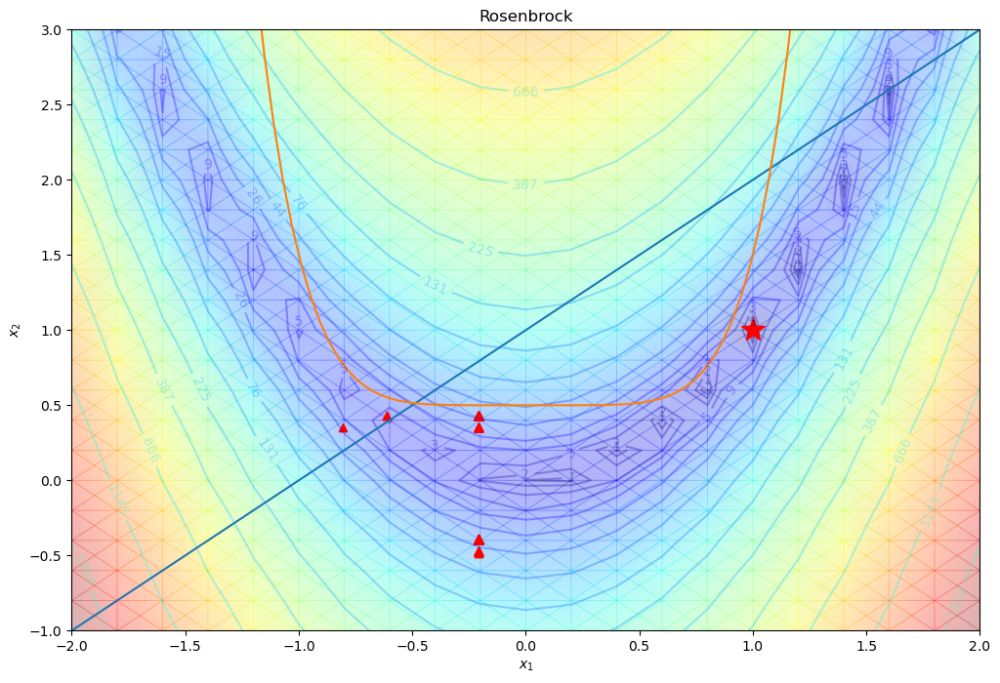

In [52]:
#Illustration son the Rosenbrock function
def Rosenbrock(x):
    return 100*(x[1]-x[0]**2)**2+(1-x[0])**2
f=Rosenbrock
xmin, xmax, xstep = -2., 2., .2
ymin, ymax, ystep = -1., 3., .2
X, Y = np.meshgrid(np.arange(xmin, xmax + xstep, xstep), np.arange(ymin, ymax + ystep, ystep))
##### Plot Rosenbrock 2D ######
plt.figure(figsize=(12, 8))
z_rosenbrock = np.array([f(np.array([x,y])) for x, y in zip(np.ravel(X), np.ravel(Y))])
Z_rosenbrock  = z_rosenbrock.reshape(X.shape)
CS=plt.contour(X, Y, Z_rosenbrock, levels=np.logspace(0, 8, 35), norm=LogNorm(), cmap=plt.cm.jet,alpha=0.3)
plt.plot([Optimum_Rosenbrock[0]],[Optimum_Rosenbrock[1]], 'r*', markersize=18)
plt.clabel(CS,inline=1,fontsize=10)
plt.pcolormesh(X,Y,Z_rosenbrock,shading='gouraud',norm=PowerNorm(gamma=0.3),cmap=plt.cm.jet,alpha=0.3)
t=np.linspace(-2,2,100)
G1=[t[i]+1 for i in range(len(t))]
G2=[t[i]**6+0.5 for i in range(len(t))]
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.plot(t,G1)
plt.plot(t,G2)
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.title('Rosenbrock')
plt.scatter([candidate[0] for candidate in (final_pop)],[candidate[1] for candidate in (final_pop)],marker='^', c='red')

### Exercice 

Test the different constraint handling methods for handling the constraints.
